This notebook reproduces the experimental results presented in our manuscript. Instructions for accessing the data are available in /data/README.md.

In [1]:
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt

import scanpy as sc
import seaborn as sns

import sys 
sys.path.append("..") 
sys.path.append("../..") 

In [2]:
path="../../datasets/Mouse_Brain_H3K27me3/"
result_path=path.replace("datasets","results")

In [3]:
import scanpy as sc
adata = sc.read_h5ad(path + 'adata_RNA.h5ad')
adata_atac = sc.read_h5ad(path + 'adata_ATAC.h5ad')

adata.var_names_make_unique()
adata_atac.var_names_make_unique()

In [4]:
adata,adata_atac

(AnnData object with n_obs × n_vars = 9752 × 25881
     obs: 'nCount_Spatial', 'nFeature_Spatial', 'nCount_SCT', 'nFeature_SCT', 'nCount_H3K27me3', 'nFeature_H3K27me3', 'nCount_peaks', 'nFeature_peaks', 'RNA_clusters', 'H3K27me3_clusters'
     var: 'name'
     obsm: 'X_lsi', 'X_pca', 'X_umap', 'spatial',
 AnnData object with n_obs × n_vars = 9752 × 70470
     obs: 'nCount_Spatial', 'nFeature_Spatial', 'nCount_SCT', 'nFeature_SCT', 'nCount_H3K27me3', 'nFeature_H3K27me3', 'nCount_peaks', 'nFeature_peaks', 'RNA_clusters', 'H3K27me3_clusters'
     var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'count', 'percentile'
     obsm: 'X_lsi', 'X_pca', 'X_umap', 'spatial')

In [4]:
from muon import atac as ac
from model.utils import pca 

# RNA
sc.pp.filter_genes(adata, min_cells=10)

sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=3000)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.scale(adata)


adata = adata[:, adata.var['highly_variable']]
adata.obsm['X_RNA'] = pca(adata, n_comps=50)

# ATAC
adata_atac = adata_atac[adata.obs_names].copy()  # .obsm['X_lsi'] represents the dimension reduced feature
ac.pp.tfidf(adata_atac, scale_factor=1e4)
sc.pp.normalize_per_cell(adata_atac, counts_per_cell_after=1e4)
sc.pp.log1p(adata_atac)
adata_atac.obsm['X_ATAC'] = pca(adata_atac, n_comps=50)

adata.obsm['X_ATAC']=adata_atac.obsm['X_ATAC']


/tmp/ipykernel_3435067/635057707.py:14: ImplicitModificationWarning: Setting element `.obsm['X_RNA']` of view, initializing view as actual.
  adata.obsm['X_RNA'] = pca(adata, n_comps=50)


In [109]:
benchmarking=['MOFA+', 'MEFISTO', 'MultiVI', 'PRESENT', 'scMM', 'SpatialGlue', 'CellCharter','MISO','COSMOS','SMART']
paths=['adata_mofa.h5ad', 'adata_mefisto.h5ad', 'adata_MultiVI.h5ad', 'adata_present.h5ad', 'adata_scMM.h5ad', 'adata_SpatialGlue.h5ad',  
       'adata_cellcharter.h5ad','adata_miso.h5ad','adata_COSMOS.h5ad','adata_SMART.h5ad']
vs=["X_mofa","X_mefisto","X_MultiVI","embeddings","X_scMM","X_SpatialGlue","X_cellcharter","X_miso","COSMOS","SMART"]

In [110]:
result_path=path.replace("datasets","results")

for i,j,v in zip(benchmarking,paths,vs):
    a=sc.read_h5ad(result_path+j)
    a.obs.index=[k.split('_')[0] for k in a.obs.index]
    a=a[adata.obs_names]
    print(a.obsm)
    adata.obsm[f"X_{i}"]=a.obsm[v]
    print(i,adata.obsm[f"X_{i}"].shape)

AxisArraysView with keys: X_lsi, X_mofa, X_pca, X_umap, feat, spatial
MOFA+ (9752, 30)
AxisArraysView with keys: X_lsi, X_mefisto, X_pca, X_umap, feat, spatial
MEFISTO (9752, 30)
AxisArraysView with keys: X_MultiVI, spatial
MultiVI (9752, 64)
AxisArraysView with keys: X_lsi, X_pca, X_umap, embeddings, spatial
PRESENT (9752, 64)
AxisArraysView with keys: X_lsi, X_pca, X_scMM, X_umap, spatial
scMM (9752, 64)
AxisArraysView with keys: X_SpatialGlue, X_lsi, X_pca, X_umap, adj_feature, feat, spatial
SpatialGlue (9752, 64)
AxisArraysView with keys: X_cellcharter, X_lsi, X_pca, X_scVI, X_umap, spatial
CellCharter (9752, 100)
AxisArraysView with keys: X_lsi, X_miso, X_pca, X_umap, spatial
MISO (9752, 96)
AxisArraysView with keys: COSMOS, Omics1_PCA, Omics1_PCA_norm, Omics2_PCA, Omics2_PCA_norm, Weights, X_lsi, X_pca, X_umap, spatial
COSMOS (9752, 50)
AxisArraysView with keys: SMART, SMART_pca, X_lsi, X_pca, X_umap, feat, spatial
SMART (9752, 64)


In [53]:
adata_WNN=sc.read_h5ad(result_path+"adata_WNN.h5ad")
adata_SNF=sc.read_h5ad(result_path+"adata_SNF.h5ad")
adata_WNN,adata_SNF

(AnnData object with n_obs × n_vars = 9752 × 0
     obs: 'rna:nCount_Spatial', 'rna:nFeature_Spatial', 'rna:nCount_SCT', 'rna:nFeature_SCT', 'rna:nCount_H3K27me3', 'rna:nFeature_H3K27me3', 'rna:nCount_peaks', 'rna:nFeature_peaks', 'rna:RNA_clusters', 'rna:H3K27me3_clusters', 'atac:nCount_Spatial', 'atac:nFeature_Spatial', 'atac:nCount_SCT', 'atac:nFeature_SCT', 'atac:nCount_H3K27me3', 'atac:nFeature_H3K27me3', 'atac:nCount_peaks', 'atac:nFeature_peaks', 'atac:RNA_clusters', 'atac:H3K27me3_clusters', 'rna:mod_weight', 'atac:mod_weight'
     uns: 'neighbors', 'umap'
     obsm: 'X_lsi', 'X_pca', 'X_umap', 'atac', 'rna', 'spatial'
     obsp: 'connectivities', 'distances',
 AnnData object with n_obs × n_vars = 9752 × 0
     obs: 'rna:nCount_Spatial', 'rna:nFeature_Spatial', 'rna:nCount_SCT', 'rna:nFeature_SCT', 'rna:nCount_H3K27me3', 'rna:nFeature_H3K27me3', 'rna:nCount_peaks', 'rna:nFeature_peaks', 'rna:RNA_clusters', 'rna:H3K27me3_clusters', 'atac:nCount_Spatial', 'atac:nFeature_Spatial',

In [105]:
for i in adata.obsm:
    print(i,adata.obsm[i].shape)

cluster1,cluster2=4,22

X_ATAC (9752, 50)
X_ATAC_pca (9752, 20)
X_COSMOS (9752, 50)
X_COSMOS_pca (9752, 20)
X_CellCharter (9752, 100)
X_CellCharter_pca (9752, 20)
X_MEFISTO (9752, 30)
X_MEFISTO_pca (9752, 20)
X_MISO (9752, 96)
X_MISO_pca (9752, 20)
X_MOFA+ (9752, 30)
X_MOFA+_pca (9752, 20)
X_MultiVI (9752, 64)
X_MultiVI_pca (9752, 20)
X_PRESENT (9752, 64)
X_PRESENT_pca (9752, 20)
X_RNA (9752, 50)
X_RNA_pca (9752, 20)
X_SMART (9752, 64)
X_SMART_pca (9752, 20)
X_SpatialGlue (9752, 64)
X_SpatialGlue_pca (9752, 20)
X_lsi (9752, 50)
X_pca (9752, 50)
X_scMM (9752, 64)
X_scMM_pca (9752, 20)
X_umap (9752, 2)
spatial (9752, 2)


In [10]:
cluster1,cluster2=4,22

In [111]:
for i in ['SMART']:
    print(i)
    for n in range(cluster1,cluster2):
        clustering(adata, key="X_"+i, add_key=f"{i}_{n}", n_clusters=n, method="mclust", use_pca=True)

SMART
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |===========================================================

In [112]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, adjusted_mutual_info_score, \
    homogeneity_score, mutual_info_score, v_measure_score,fowlkes_mallows_score,silhouette_score,\
    davies_bouldin_score,calinski_harabasz_score

result = pd.DataFrame(columns=["n_cluster","method","metries","score"])
for j in range(cluster1,cluster2):
    d2={"SCI":silhouette_score(adata.obsm["X_SMART"],adata.obs[f"SMART_{j}"]),
        "DBI":davies_bouldin_score(adata.obsm["X_SMART"],adata.obs[f"SMART_{j}"]),
        "CH":calinski_harabasz_score(adata.obsm["X_SMART"],adata.obs[f"SMART_{j}"])}
    for k,v in d2.items():
        result.loc[len(result.index)]=[j,"SMART",k,v]
        
for j in range(cluster1+1,cluster2-1):
    mean_fmi=fowlkes_mallows_score(adata.obs[f"SMART_{j-1}"],adata.obs[f"SMART_{j}"])+fowlkes_mallows_score(adata.obs[f"SMART_{j}"],adata.obs[f"SMART_{j+1}"])
    result.loc[len(result.index)]=[j,"SMART","mean_FMI",mean_fmi]
    print(j,mean_fmi)            

result.to_csv(result_path+"result.csv")

5 1.7054138899659814
6 1.8637733325949117
7 1.8888413177901975
8 1.8221230751391089
9 1.8710991189338009
10 1.8224640194917159
11 1.7947690988491019
12 1.8507971222103778
13 1.7744534228539661
14 1.7116694826132233
15 1.805682456267936
16 1.876179643838599
17 1.8290314229753382
18 1.7938983778082624
19 1.7899889110751468
20 1.8780132486369823


In [3]:
result=pd.read_csv(result_path+"result.csv")

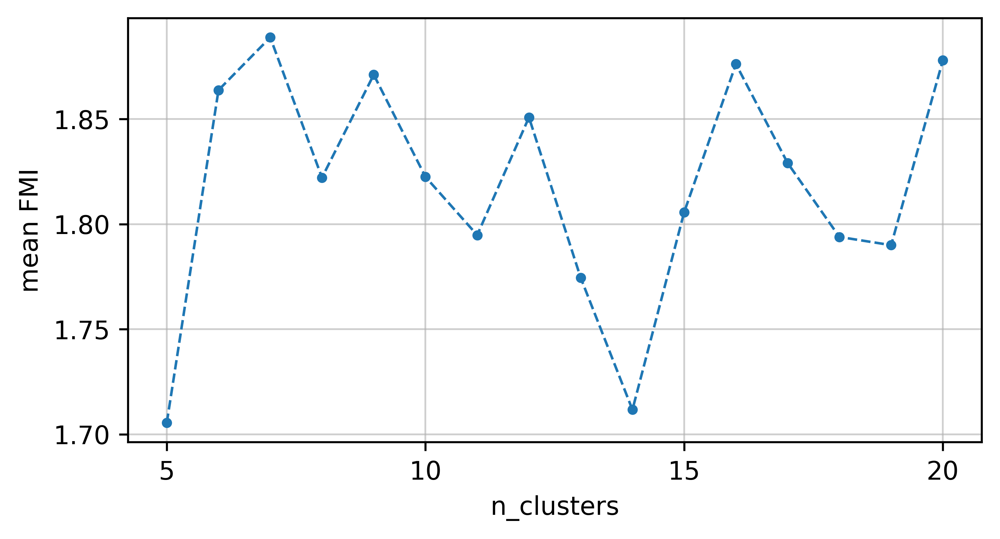

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
f,ax=plt.subplots(1,1,figsize=(6,3),dpi=600)
sns.lineplot(data=result[result["metries"]=='mean_FMI'],x="n_cluster",y="score", 
             linestyle='--',
             # color='red',
             marker='o', 
             linewidth=1,
            markersize=4,
            markeredgewidth=0,
             ax=ax)

ax.grid(True, which='major', axis='both', linestyle='-', linewidth=0.7, alpha=0.6)
ax.set_ylabel("mean FMI")
ax.set_xlabel("n_clusters")
ax.set_xticks([5,10,15,20])
f.savefig("fmi.svg",format="svg",bbox_inches='tight',transparent=True)

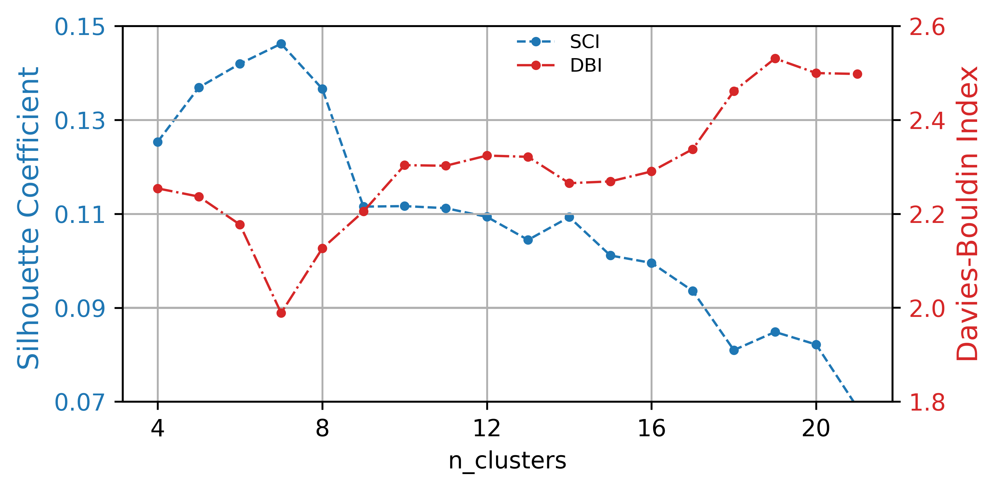

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(6, 3), dpi=600)
df = result[result["metries"] == 'SCI']

# Plot the line chart for the first y-axis
ax1.plot(df['n_cluster'], df['score'], color='tab:blue', label='SCI',
         marker='o',
         markersize=3,
         linewidth=1,
         linestyle='--',)
ax1.set_xlabel('n_clusters')
ax1.set_ylabel('Silhouette Coefficient', color='tab:blue', fontsize=12)
ax1.set_ylim(0.07, 0.15)
ax1.set_yticks([0.07, 0.09, 0.11, 0.13, 0.15])
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_xticks([4, 8, 12, 16, 20])

# Create the second y-axis
df = result[result["metries"] == 'DBI']
ax2 = ax1.twinx()
ax2.plot(df['n_cluster'], df['score'], color='tab:red', label='DBI',
         marker='o',
         markersize=3,
         linewidth=1,
         linestyle='-.',)
ax2.set_ylabel('Davies-Bouldin Index', color='tab:red', fontsize=12)
ax2.set_ylim(1.8, 2.6)
ax2.tick_params(axis='y', labelcolor='tab:red')

# Add grid lines
ax1.grid("on")
ax2.grid("on")

# Add legend
fig.legend(loc="upper left", bbox_to_anchor=(0.5, 0.95), frameon=False)

# Show the plot
# plt.title("Dual Y-axis line chart")
plt.tight_layout()
plt.show()

# Save figure
fig.savefig("sci.svg", format="svg", bbox_inches='tight', transparent=True)

In [118]:
for r in np.arange(0.1,1.5,0.03):
    sc.tl.leiden(adata_WNN,resolution=r,key_added=f"WNN_{r}")
    ncluster=len(adata_WNN.obs[f"WNN_{r}"].unique())
    print(f"resolution={r},ncluster={ncluster}")
    if ncluster>=cluster2:
        break
    
for n in range(cluster1,cluster2):
    for i in adata_WNN.obs:
        if "WNN_" in i and len(adata_WNN.obs[i].unique())==n:
            adata.obs[f"WNN_{n}"]=adata_WNN.obs[i]
            break


resolution=0.1,ncluster=4
resolution=0.13,ncluster=4
resolution=0.16,ncluster=4
resolution=0.19,ncluster=5
resolution=0.22,ncluster=5
resolution=0.25,ncluster=6
resolution=0.28,ncluster=8
resolution=0.31,ncluster=8
resolution=0.33999999999999997,ncluster=8
resolution=0.37,ncluster=8
resolution=0.4,ncluster=9
resolution=0.42999999999999994,ncluster=10
resolution=0.45999999999999996,ncluster=9
resolution=0.49,ncluster=10
resolution=0.52,ncluster=10
resolution=0.5499999999999999,ncluster=10
resolution=0.58,ncluster=11
resolution=0.61,ncluster=11
resolution=0.64,ncluster=11
resolution=0.6699999999999999,ncluster=12
resolution=0.7,ncluster=12
resolution=0.73,ncluster=14
resolution=0.7599999999999999,ncluster=14
resolution=0.7899999999999999,ncluster=14
resolution=0.82,ncluster=14
resolution=0.85,ncluster=13
resolution=0.88,ncluster=14
resolution=0.9099999999999999,ncluster=15
resolution=0.94,ncluster=17
resolution=0.97,ncluster=16
resolution=0.9999999999999999,ncluster=17
resolution=1.03,nc

In [120]:
for r in np.arange(0.2,3,0.03):
    sc.tl.louvain(adata_SNF,resolution=r,key_added=f"SNF_{r}")
    ncluster=len(adata_SNF.obs[f"SNF_{r}"].unique())
    print(f"resolution={r},ncluster={ncluster}")
    if ncluster>=cluster2+1:
        break
        
for n in range(cluster1,cluster2):
    for i in adata_SNF.obs:
        if "SNF_" in i and len(adata_SNF.obs[i].unique())==n:
            adata.obs[f"SNF_{n}"]=adata_SNF.obs[i]
            break

resolution=0.2,ncluster=3
resolution=0.23,ncluster=3
resolution=0.26,ncluster=3
resolution=0.29000000000000004,ncluster=4
resolution=0.32,ncluster=4
resolution=0.35,ncluster=4
resolution=0.38,ncluster=5
resolution=0.41000000000000003,ncluster=5
resolution=0.44,ncluster=6
resolution=0.47000000000000003,ncluster=6
resolution=0.5,ncluster=6
resolution=0.53,ncluster=6
resolution=0.56,ncluster=6
resolution=0.5900000000000001,ncluster=6
resolution=0.62,ncluster=7
resolution=0.6499999999999999,ncluster=8
resolution=0.6799999999999999,ncluster=8
resolution=0.71,ncluster=8
resolution=0.74,ncluster=8
resolution=0.77,ncluster=8
resolution=0.8,ncluster=9
resolution=0.8300000000000001,ncluster=9
resolution=0.8599999999999999,ncluster=9
resolution=0.8899999999999999,ncluster=10
resolution=0.9199999999999999,ncluster=10
resolution=0.95,ncluster=10
resolution=0.98,ncluster=10
resolution=1.01,ncluster=11
resolution=1.04,ncluster=11
resolution=1.07,ncluster=12
resolution=1.0999999999999999,ncluster=12
r

In [ ]:
import os

os.environ['R_HOME'] = '/home/ws6tg/anaconda3/envs/EnvR43/lib/R/'
from smart.utils import clustering
for i in ['MEFISTO']:
    print(i)
    for n in range(cluster1,cluster2):
        clustering(adata, key="X_"+i, add_key=f"{i}_{n}", n_clusters=n, method="gmm", use_pca=True)
        
for i in ['RNA','ATAC','MOFA+',  'MultiVI', 'scMM', 'SpatialGlue', 'SMART','PRESENT', 'CellCharter','MISO','COSMOS']:
    print(i)
    for n in range(cluster1,cluster2):
        clustering(adata, key="X_"+i, add_key=f"{i}_{n}", n_clusters=n, method="mclust", use_pca=True)

MEFISTO
RNA


R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.0.0
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |=================================================================

In [12]:
adata.write_h5ad(result_path+"adata_all.h5ad")

In [27]:
adata=sc.read_h5ad(result_path+"adata_all.h5ad")
adata

AnnData object with n_obs × n_vars = 9752 × 3000
    obs: 'nCount_Spatial', 'nFeature_Spatial', 'nCount_SCT', 'nFeature_SCT', 'nCount_H3K27me3', 'nFeature_H3K27me3', 'nCount_peaks', 'nFeature_peaks', 'RNA_clusters', 'H3K27me3_clusters', 'WNN_4', 'WNN_5', 'WNN_6', 'WNN_8', 'WNN_9', 'WNN_10', 'WNN_11', 'WNN_12', 'WNN_13', 'WNN_14', 'WNN_15', 'WNN_16', 'WNN_17', 'WNN_18', 'WNN_19', 'WNN_21', 'SNF_4', 'SNF_5', 'SNF_6', 'SNF_7', 'SNF_8', 'SNF_9', 'SNF_10', 'SNF_11', 'SNF_12', 'SNF_13', 'SNF_14', 'SNF_15', 'SNF_16', 'SNF_18', 'SNF_19', 'MEFISTO_4', 'MEFISTO_5', 'MEFISTO_6', 'MEFISTO_7', 'MEFISTO_8', 'MEFISTO_9', 'MEFISTO_10', 'MEFISTO_11', 'MEFISTO_12', 'MEFISTO_13', 'MEFISTO_14', 'MEFISTO_15', 'MEFISTO_16', 'MEFISTO_17', 'MEFISTO_18', 'MEFISTO_19', 'MEFISTO_20', 'MEFISTO_21', 'mclust', 'RNA_4', 'RNA_5', 'RNA_6', 'RNA_7', 'RNA_8', 'RNA_9', 'RNA_10', 'RNA_11', 'RNA_12', 'RNA_13', 'RNA_14', 'RNA_15', 'RNA_16', 'RNA_17', 'RNA_18', 'RNA_19', 'RNA_20', 'RNA_21', 'ATAC_4', 'ATAC_5', 'ATAC_6', 'ATA

In [29]:
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.neighbors import kneighbors_graph
from scipy.stats import pearsonr

dis1=pairwise_distances(adata.obsm["X_ATAC"])
dis2=pairwise_distances(adata.obsm["X_RNA"])
df=pd.DataFrame(columns=["methods","modality","pearsonr"])
for j in ['MOFA+', 'MEFISTO','MultiVI', 'PRESENT', 'scMM', 'SpatialGlue','SMART', 'CellCharter','MISO','COSMOS']:
    dis=pairwise_distances(adata.obsm[f"X_{j}"])
    for i in range(dis.shape[0]):
        corr, _ = pearsonr(dis[i], dis1[i])
        df.loc[len(df)]=[j,"H3K27me3",corr]
        corr, _ = pearsonr(dis[i], dis2[i])
        df.loc[len(df)]=[j,"RNA",corr]


/tmp/ipykernel_108818/3791959972.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')


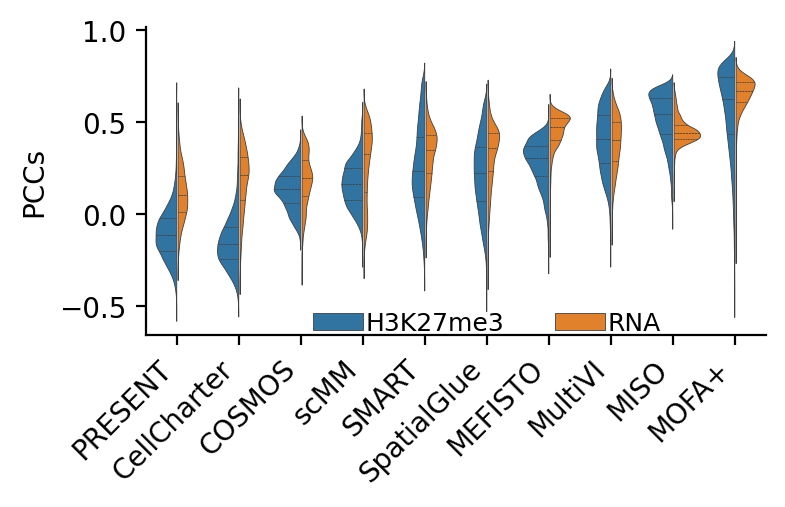

In [30]:
df_s=df[df["modality"]=="H3K27me3"].groupby("methods")["pearsonr"].median()+df[df["modality"]=="RNA"].groupby("methods")["pearsonr"].median()

fig,ax = plt.subplots(figsize=(4,2),dpi=200)
sns.violinplot(df,x="methods",y="pearsonr",hue="modality", split=True, gap=.05, inner="quart",linewidth=0.3,width=0.9,order=df_s.sort_values(ascending=True).index)
ax.set_ylabel("PCCs")
ax.set_xlabel("")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')
ax.legend(bbox_to_anchor=(0.55,0.15),frameon=False,ncol=3,labelspacing=0.2,handletextpad=0.1,fontsize=9)
sns.despine()
fig.savefig("PCCs1.svg",format="svg",bbox_inches='tight',transparent=True)

In [30]:
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.neighbors import kneighbors_graph
from scipy.stats import pearsonr

dis1=pairwise_distances(adata.obsm["X_ATAC"])
dis2=pairwise_distances(adata.obsm["X_RNA"])

df2=pd.DataFrame(columns=["cluster","modality","pearsonr"])
dis=pairwise_distances(adata.obsm[f"X_SMART"])
for i,j in enumerate(adata.obs["SMART_12"].values):
    corr, _ = pearsonr(dis[i], dis1[i])
    df2.loc[len(df2)]=[j,"H3K27me3",corr]
    corr, _ = pearsonr(dis[i], dis2[i])
    df2.loc[len(df2)]=[j,"RNA",corr]

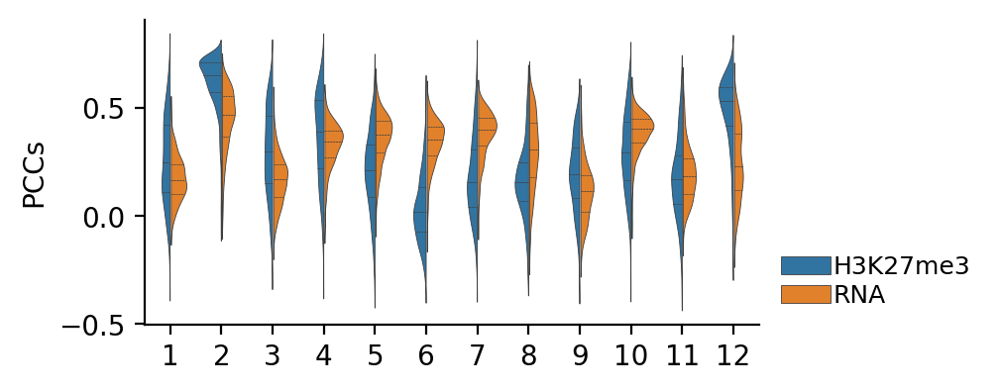

In [31]:
fig,ax = plt.subplots(figsize=(4,2),dpi=200)
sns.violinplot(df2,x="cluster",y="pearsonr",hue="modality", split=True, gap=.05, inner="quart",linewidth=0.3,width=0.9)
ax.set_ylabel("PCCs")
ax.set_xlabel("")
ax.legend(bbox_to_anchor=(1,0.3),frameon=False,ncol=1,labelspacing=0.2,handletextpad=0.1,fontsize=9)
sns.despine()
fig.savefig("PCCs2_12.svg",format="svg",bbox_inches='tight',transparent=True)

In [ ]:
color_dicts = {
    'MOFA+': '#1f77b4',     # blue
    'MEFISTO': '#ff7f0e',   # orange
    'MultiVI': '#2ca02c',   # green
    'PRESENT': '#d62728',   # red
    'scMM': '#9467bd',      # purple
    'SpatialGlue': '#8c564b',  # brown
    'TotalVI': '#e377c2',   # pink
    'SpaMultiVAE': '#7f7f7f',  # gray
    'CellCharter': '#bcbd22',  # yellow-green
    'MISO': '#17becf',      # cyan
    'COSMOS': '#FFC0CB',    # light pink
    'SMART': '#ff69b4',     # hot pink
    'SNF': '#ff6347',       # tomato red
    'WNN': '#4682b4',       # steel blue
}


In [ ]:
import squidpy as sq

df1=pd.DataFrame(columns=["method","cluster","morans_i"])
sc.pp.neighbors(adata, use_rep="spatial",n_neighbors=10)
for j in ['SNF','WNN','MOFA+', 'MEFISTO','MultiVI', 'PRESENT', 'scMM', 'SpatialGlue', 'SMART','CellCharter','MISO','COSMOS']:
    for i in range(cluster1,cluster2):
        if f"{j}_{i}" in adata.obs.columns:
            r=sq.gr.spatial_autocorr(adata, connectivity_key='connectivities', genes=[f"{j}_{i}"], mode='moran',attr="obs",copy=True) 
            #alt = sc.metrics.morans_i(adata, obsm=f"X_{j}")
            df1.loc[len(df1)]=[j,i,r["I"][0]]
df1["method"]=df1["method"].map(lambda x:"SMART" if x=='SMART' else x)

/tmp/ipykernel_108818/2352371305.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  df1.loc[len(df1)]=[j,i,r["I"][0]]
/tmp/ipykernel_108818/2352371305.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  df1.loc[len(df1)]=[j,i,r["I"][0]]
/tmp/ipykernel_108818/2352371305.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  df1.loc[len(df1)]=[j,i,r["I"][0]]
/tmp/ipykernel_108818/2352371305.py:10: FutureWarning: Series.__getitem__ tr

/tmp/ipykernel_108818/4017868743.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,fliersize=2,palette=color_dicts,order=df1.groupby("method")["morans_i"].median().sort_values(ascending=True).index)
/tmp/ipykernel_108818/4017868743.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=35, ha='right')


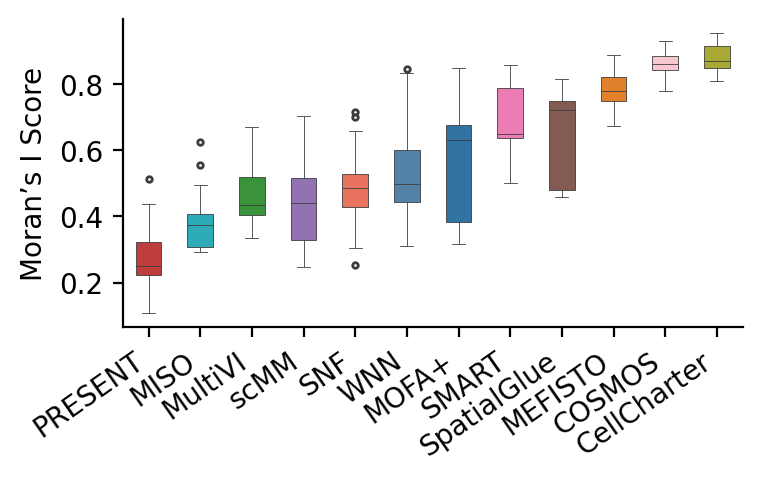

In [18]:
fig,ax = plt.subplots(figsize=(4,2),dpi=200)
sns.boxplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,fliersize=2,palette=color_dicts,order=df1.groupby("method")["morans_i"].median().sort_values(ascending=True).index)
ax.set_ylabel("Moran’s I Score")
ax.set_xlabel("")
ax.set_xticklabels(ax.get_xticklabels(),rotation=35, ha='right')
sns.despine()
fig.savefig("Moran.svg",format="svg",bbox_inches='tight',transparent=True)

/tmp/ipykernel_3435067/587128329.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,palette=color_dicts,edgecolor="black",order=df1.groupby("method")["morans_i"].median().sort_values(ascending=True).index)
/tmp/ipykernel_3435067/587128329.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=30, ha='right')


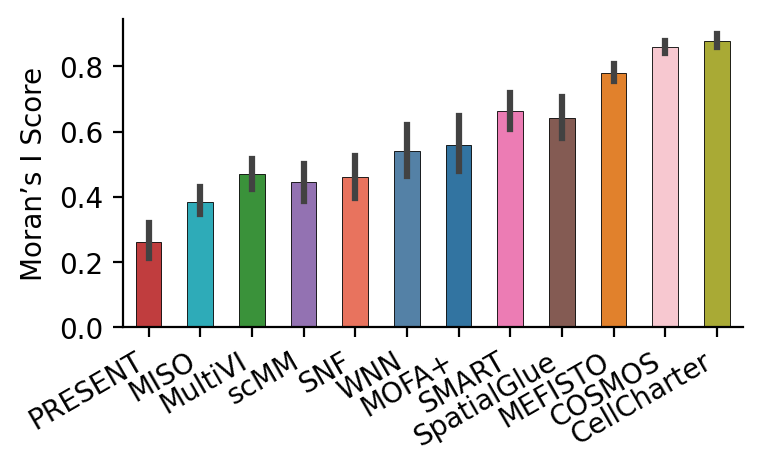

In [123]:
fig,ax = plt.subplots(figsize=(4,2),dpi=200)
#df2=df1[df1["cluster"]==11]
sns.barplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,palette=color_dicts,edgecolor="black",order=df1.groupby("method")["morans_i"].median().sort_values(ascending=True).index)
ax.set_ylabel("Moran’s I Score")
ax.set_xlabel("")
ax.set_xticklabels(ax.get_xticklabels(),rotation=30, ha='right')
sns.despine()

In [58]:
for i,j in zip(benchmarking,paths):
    if i=="SMART":
        a=sc.read_h5ad(result_path+j)
        a.obs.index=[k.split('_')[0] for k in a.obs.index]
        a=a[adata.obs_names]
        print(a.obsm)
        adata.obsm[f"X_{i}"]=next(iter(a.obsm.values()))
        print(i,adata.obsm[f"X_{i}"].shape)
        
import os

os.environ['R_HOME'] = '/home/ws6tg/anaconda3/envs/EnvR43/lib/R/'       
from model.utils import clustering

for i in ['SMART']:
    print(i)
    for n in range(cluster1,cluster2):
        clustering(adata, key="X_"+i, add_key=f"{i}_{n}", n_clusters=n, method="mclust", use_pca=True)

AxisArraysView with keys: SMART, SMART_pca, feat, spatial
SMART (1263, 64)
SMART
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%


In [ ]:
colors = [
    '#1f77b4',  # blue
    '#ff7f0e',  # orange
    '#2ca02c',  # green
    '#d62728',  # red
    '#9467bd',  # purple
    '#8c564b',  # brown
    '#e377c2',  # pink
    '#7f7f7f',  # gray
    '#bcbd22',  # yellow
    '#17becf',  # cyan
    '#4a90e2',  # dark blue
    '#f5a623',  # dark orange
    '#7ed321',  # dark green
    '#d0021b',  # dark red
    '#8b6bbf',  # dark purple
    '#a7a8aa',  # dark gray
]

In [ ]:
n=11
colordict=dict(zip(adata.obs[f'SMART_{n}'].unique(),colors))

map_dict_11={
    1:"1-MS",
    2:"2-CTX",
    3:"3-LS",
    4:"4-CTX",
    5:"5-CP",
    6:"6-CTX",
    7:"7-ccg/aco",
    8:"8-VL",
    9:"9-CTX",
    10:"10-ACB",
    11:"11-ACA",
}

colordict11={j:colordict[i] for i,j in map_dict_11.items()}

adata.obs["SMART_11_anno"]=adata.obs["SMART_11"].map(map_dict_11)

In [42]:
n=12
colordict=dict(zip(adata.obs[f'SMART_{n}'].unique(),colors))

map_dict_12={
    1:"1-MS",
    2:"2-CTX",
    3:"3-LS",
    4:"4-CTX",
    5:"5-CP",
    6:"6-CTX",
    7:"7-CTX",
    8:"8-ccg/aco",
    9:"9-VL",
    10:"10-CTX",
    11:"11-ACB",
    12:"12-ACA",
}

colordict12={j:colordict[i] for i,j in map_dict_12.items()}

adata.obs["SMART_12_anno"]=adata.obs["SMART_12"].map(map_dict_12)

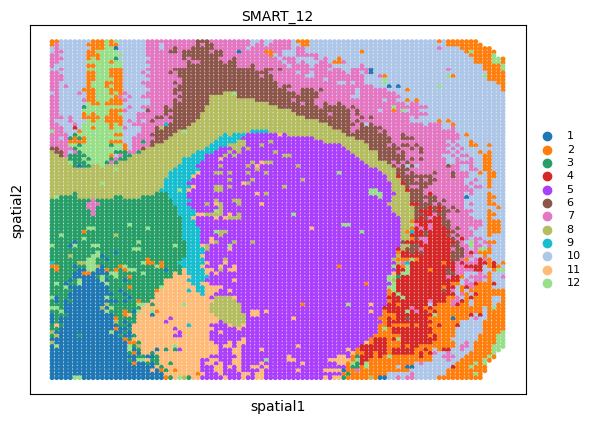

In [52]:
sc.pl.embedding(adata, basis='spatial', color=f"SMART_12",s=50)

12
7
3
9


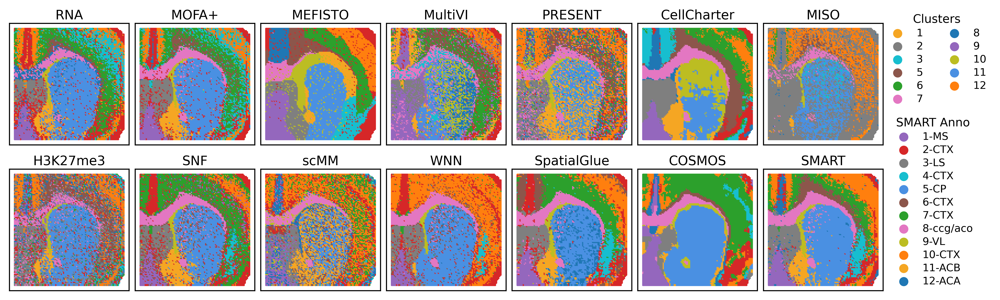

In [44]:
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
plt.rcdefaults()
plt.rcParams["axes.titlesize"] = 10
plt.rcParams["legend.fontsize"] = 8               
plt.rcParams["legend.title_fontsize"] = 9 
plt.rcParams['axes.titlepad'] = 3
plt.rcParams['legend.labelspacing'] = 0.3
# plt.rcParams['legend.handlelength'] = 1
# plt.rcParams['legend.markerscale'] = 0.7

from model.utils import getcolordict
adata.obsm["spatial"]=adata.obsm["spatial"][:,[1, 0]]
fig, ax_list = plt.subplots(2, 7, figsize=(12, 3.7),dpi=600)
plt.subplots_adjust(hspace=0.2, wspace=0.05)
for i,j in enumerate(['RNA',  'MOFA+', 'MEFISTO', 'MultiVI','PRESENT', 'CellCharter','MISO']+[ 'ATAC', 'SNF','scMM', 'WNN','SpatialGlue','COSMOS','SMART']):
    
    if j!="SMART":
        adata.obs[f"{j}_{n}"]=adata.obs[f"{j}_{n}"].astype('category')
        colordict2=getcolordict(adata,f"{j}_{n}",f"SMART_{n}",colordict)
        sc.pl.embedding(adata, basis='spatial', color=f"{j}_{n}", ax=ax_list[i//7][i%7], s=10,palette=colordict2, show=False)
    else:
        sc.pl.embedding(adata, basis='spatial', color=f"{j}_{n}_anno", ax=ax_list[i//7][i%7], s=10,palette=colordict12, show=False)
    ax_list[i//7][i%7].set_title(j if j!='ATAC' else 'H3K27me3')
    ax_list[i//7][i%7].set_xlabel("")
    ax_list[i//7][i%7].set_ylabel("")
    #ax_list[i//7][i%7].get_legend().remove()
    if i!=13 and i!=6:
        ax_list[i//7][i%7].get_legend().remove()
    elif i==13:
        ax_list[i//7][i%7].legend(loc=(1.05,0),frameon=False,ncol=1,title="SMART Anno")
    else:
        ax_list[i//7][i%7].legend(loc=(1,0.3),frameon=False,ncol=2,title="Clusters")
plt.show()
fig.savefig("cluster1.jpg",format="jpg",bbox_inches='tight',transparent=True)

12
7
3
9


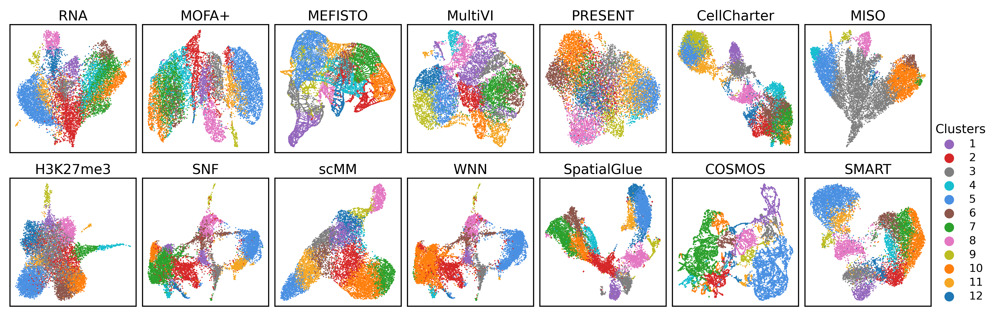

In [54]:
plt.rcParams["axes.titlesize"] = 10
fig, ax_list = plt.subplots(2, 7, figsize=(12, 3.7),dpi=600)
plt.subplots_adjust(hspace=0.2, wspace=0.05)
n=12
for i,j in enumerate(['RNA',  'MOFA+', 'MEFISTO', 'MultiVI','PRESENT', 'CellCharter','MISO']+[ 'ATAC', 'SNF','scMM', 'WNN','SpatialGlue','COSMOS','SMART']):
    
    if j=="WNN":
        colordict1=getcolordict(adata,j+f"_{n}",f"SMART_{n}",colordict)
        adata_WNN.obs[j+f"_{n}"]=adata.obs[j+f"_{n}"]
        sc.pl.umap(adata_WNN, color=j+f"_{n}", ax=ax_list[i//7][i%7], title=j, s=3,palette=colordict1, show=False)
    elif j=="SNF":
        colordict1=getcolordict(adata,j+f"_{n}",f"SMART_{n}",colordict)
        adata_SNF.obs[j+f"_{n}"]=adata.obs[j+f"_{n}"]
        sc.pl.umap(adata_SNF, color=j+f"_{n}", ax=ax_list[i//7][i%7], title=j, s=3,palette=colordict1, show=False)
    elif j=="SMART":
        sc.pp.neighbors(adata, use_rep="X_"+j, n_neighbors=10)
        sc.tl.umap(adata)
        sc.pl.umap(adata, color=j+f"_{n}", ax=ax_list[i//7][i%7], title=j, s=3,palette=colordict, show=False)
    else:
        colordict1=getcolordict(adata,j+f"_{n}",f"SMART_{n}",colordict)
        sc.pp.neighbors(adata, use_rep="X_"+j, n_neighbors=10)
        sc.tl.umap(adata)
        sc.pl.umap(adata, color=j+f"_{n}", ax=ax_list[i//7][i%7], title=j, s=3,palette=colordict1, show=False)
    ax_list[i//7][i%7].set_title(j if j!='ATAC' else 'H3K27me3')
    ax_list[i//7][i%7].set_xlabel("")
    ax_list[i//7][i%7].set_ylabel("")
    if i!=13:
        ax_list[i//7][i%7].get_legend().remove()
    else:
        ax_list[i//7][i%7].legend(loc=(1,0),frameon=False,title="Clusters")
plt.show()
fig.savefig("Umap1.jpg",format="jpg",bbox_inches='tight',transparent=True)

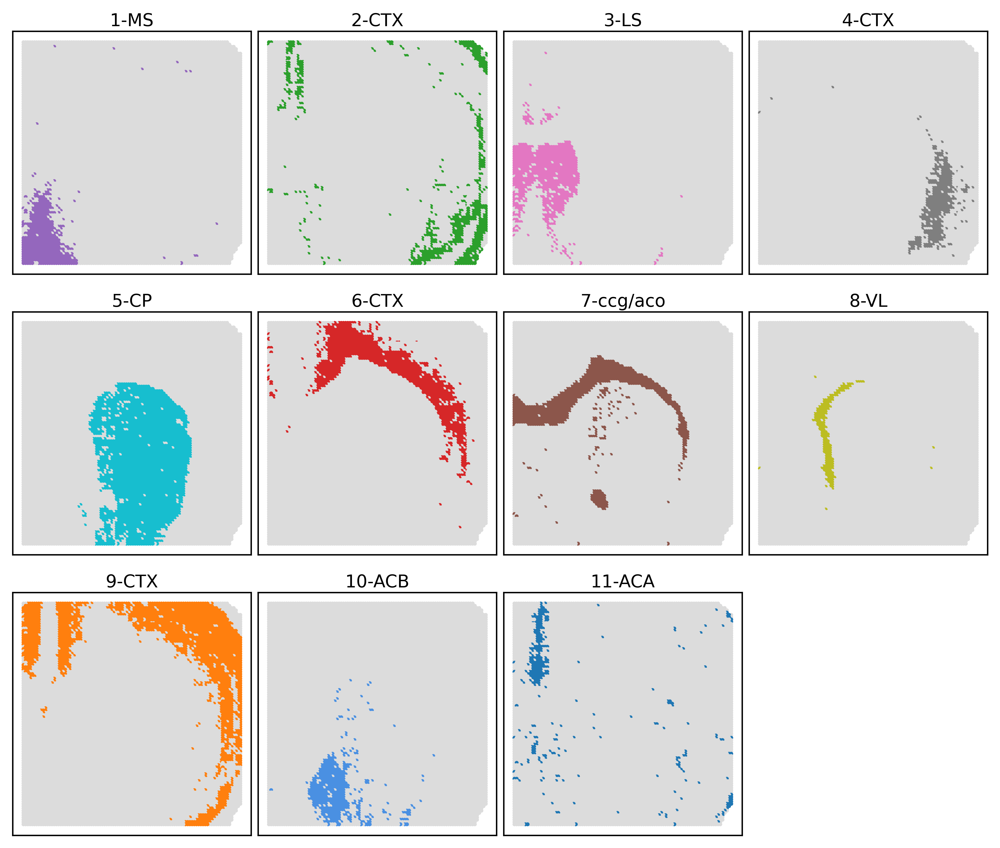

In [37]:

k=4
fig, ax_list = plt.subplots(3, k, figsize=(8, 6.8),dpi=600)

#colordict={i+1:c for i,c in enumerate(colors)}

for j in range(11):
    sc.pl.embedding(adata, basis='spatial', color='SMART_11',s=20, palette={i+1:colordict[j+1] if i==j else "#DCDCDC" for i in range(11)},ax=ax_list[j//k][j%k],title=map_dict[j+1],show=False)
    ax_list[j//k][j%k].set_xlabel("")
    ax_list[j//k][j%k].set_ylabel("")
    ax_list[j//k][j%k].get_legend().remove()
ax_list[2][3].remove()
plt.tight_layout(w_pad=0.4)
plt.show()
fig.savefig("cluster2.jpg",format="jpg",bbox_inches='tight',transparent=True)

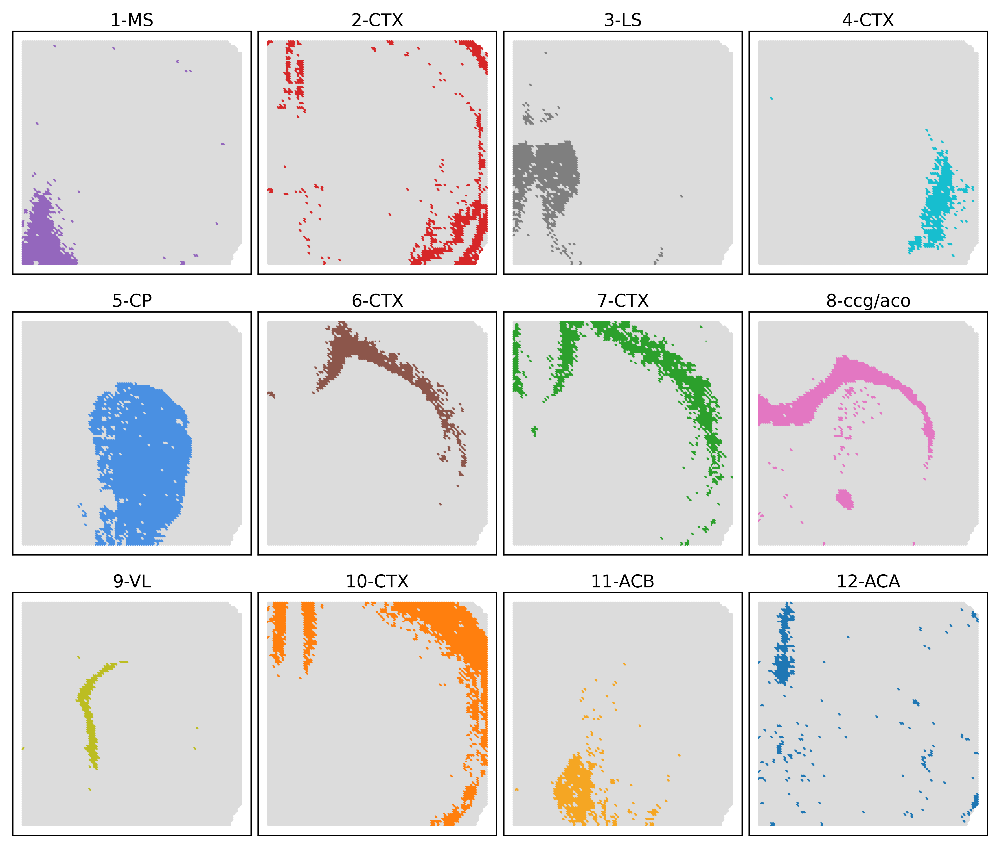

In [55]:
k=4
fig, ax_list = plt.subplots(3, k, figsize=(8, 6.8),dpi=600)

#colordict={i+1:c for i,c in enumerate(colors)}

for j in range(12):
    sc.pl.embedding(adata, basis='spatial', color='SMART_12',s=20, palette={i+1:colordict[j+1] if i==j else "#DCDCDC" for i in range(12)},ax=ax_list[j//k][j%k],title=map_dict_12[j+1],show=False)
    ax_list[j//k][j%k].set_xlabel("")
    ax_list[j//k][j%k].set_ylabel("")
    ax_list[j//k][j%k].get_legend().remove()
#ax_list[2][3].remove()
plt.tight_layout(w_pad=0.4)
plt.show()
fig.savefig("cluster2.jpg",format="jpg",bbox_inches='tight',transparent=True)

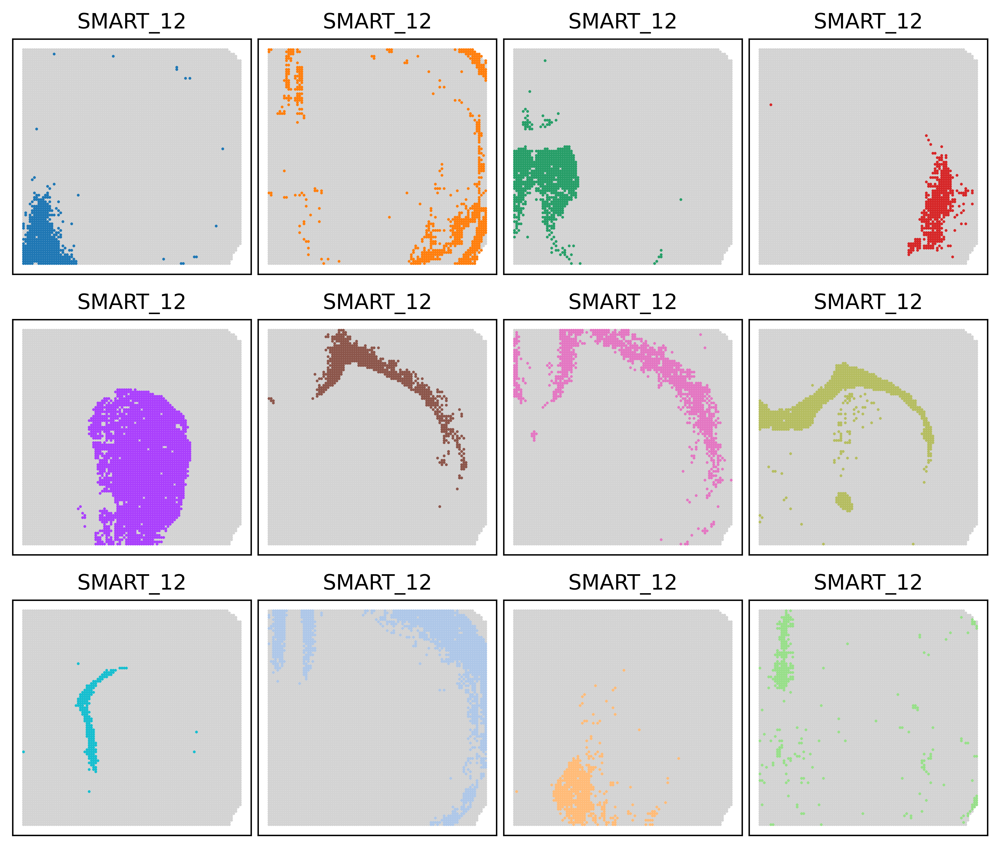

In [37]:
k=4
fig, ax_list = plt.subplots(3, k, figsize=(8, 6.8),dpi=600)

#colordict={i+1:c for i,c in enumerate(colors)}
adata.obsm["spatial"]=adata.obsm["spatial"][:,[1, 0]]
for j in range(12):
    sc.pl.embedding(adata, basis='spatial', color='SMART_12',s=10, groups=[j+1],show=False,ax=ax_list[j//k][j%k])
    ax_list[j//k][j%k].set_xlabel("")
    ax_list[j//k][j%k].set_ylabel("")
    ax_list[j//k][j%k].get_legend().remove()
# ax_list[2][3].remove()
plt.tight_layout(w_pad=0.4)
plt.show()
fig.savefig("cluster2.jpg",format="jpg",bbox_inches='tight',transparent=True)